In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import warnings
warnings.filterwarnings('ignore')
import seaborn as sns
from scipy.stats.mstats import winsorize
from scipy import stats
from scipy.stats import jarque_bera
from scipy.stats import normaltest
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler

In [2]:
df=pd.read_csv("Life Expectancy Data.csv")
df.head(-5)

,Country,Year,Status,Life expectancy,Adult Mortality,infant deaths,Alcohol,percentage expenditure,Hepatitis B,Measles,...,Polio,Total expenditure,Diphtheria,HIV/AIDS,GDP,Population,thinness 1-19 years,thinness 5-9 years,Income composition of resources,Schooling
0,Afghanistan,2015,Developing,65.0,263.0,62,0.01,71.279624,65.0,1154,...,6.0,8.16,65.0,0.1,584.259210,33736494.0,17.2,17.3,0.479,10.1
1,Afghanistan,2014,Developing,59.9,271.0,64,0.01,73.523582,62.0,492,...,58.0,8.18,62.0,0.1,612.696514,327582.0,17.5,17.5,0.476,10.0
2,Afghanistan,2013,Developing,59.9,268.0,66,0.01,73.219243,64.0,430,...,62.0,8.13,64.0,0.1,631.744976,31731688.0,17.7,17.7,0.470,9.9
3,Afghanistan,2012,Developing,59.5,272.0,69,0.01,78.184215,67.0,2787,...,67.0,8.52,67.0,0.1,669.959000,3696958.0,17.9,18.0,0.463,9.8
4,Afghanistan,2011,Developing,59.2,275.0,71,0.01,7.097109,68.0,3013,...,68.0,7.87,68.0,0.1,63.537231,2978599.0,18.2,18.2,0.454,9.5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2928,Zimbabwe,2009,Developing,50.0,587.0,30,4.64,1.040021,73.0,853,...,69.0,6.26,73.0,18.1,65.824121,1381599.0,7.5,7.4,0.419,9.9
2929,Zimbabwe,2008,Developing,48.2,632.0,30,3.56,20.843429,75.0,0,...,75.0,4.96,75.0,20.5,325.678573,13558469.0,7.8,7.8,0.421,9.7
2930,Zimbabwe,2007,Developing,46.6,67.0,29,3.88,29.814566,72.0,242,...,73.0,4.47,73.0,23.7,396.998217,1332999.0,8.2,8.2,0.414,9.6
2931,Zimbabwe,2006,Developing,45.4,7.0,28,4.57,34.262169,68.0,212,...,71.0,5.12,7.0,26.8,414.796232,13124267.0,8.6,8.6,0.408,9.5


In [3]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2938 entries, 0 to 2937
Data columns (total 22 columns):
 #   Column                           Non-Null Count  Dtype  
---  ------                           --------------  -----  
 0   Country                          2938 non-null   object 
 1   Year                             2938 non-null   int64  
 2   Status                           2938 non-null   object 
 3   Life expectancy                  2928 non-null   float64
 4   Adult Mortality                  2928 non-null   float64
 5   infant deaths                    2938 non-null   int64  
 6   Alcohol                          2744 non-null   float64
 7   percentage expenditure           2938 non-null   float64
 8   Hepatitis B                      2385 non-null   float64
 9   Measles                          2938 non-null   int64  
 10   BMI                             2904 non-null   float64
 11  under-five deaths                2938 non-null   int64  
 12  Polio               

In [4]:
df.nunique()

Country                             193
Year                                 16
Status                                2
Life expectancy                     362
Adult Mortality                     425
infant deaths                       209
Alcohol                            1076
percentage expenditure             2328
Hepatitis B                          87
Measles                             958
 BMI                                608
under-five deaths                   252
Polio                                73
Total expenditure                   818
Diphtheria                           81
 HIV/AIDS                           200
GDP                                2490
Population                         2278
 thinness  1-19 years               200
 thinness 5-9 years                 207
Income composition of resources     625
Schooling                           173
dtype: int64

In [5]:
df.isnull().sum()*100/df.shape[0]

Country                             0.000000
Year                                0.000000
Status                              0.000000
Life expectancy                     0.340368
Adult Mortality                     0.340368
infant deaths                       0.000000
Alcohol                             6.603131
percentage expenditure              0.000000
Hepatitis B                        18.822328
Measles                             0.000000
 BMI                                1.157250
under-five deaths                   0.000000
Polio                               0.646698
Total expenditure                   7.692308
Diphtheria                          0.646698
 HIV/AIDS                           0.000000
GDP                                15.248468
Population                         22.191967
 thinness  1-19 years               1.157250
 thinness 5-9 years                 1.157250
Income composition of resources     5.684139
Schooling                           5.547992
dtype: flo

In [6]:
df2=df.copy()

In [7]:
df3=pd.get_dummies(df2, columns=["Status"],drop_first=True)
df3.head()

,Country,Year,Life expectancy,Adult Mortality,infant deaths,Alcohol,percentage expenditure,Hepatitis B,Measles,BMI,...,Total expenditure,Diphtheria,HIV/AIDS,GDP,Population,thinness 1-19 years,thinness 5-9 years,Income composition of resources,Schooling,Status_Developing
0,Afghanistan,2015,65.0,263.0,62,0.01,71.279624,65.0,1154,19.1,...,8.16,65.0,0.1,584.259210,33736494.0,17.2,17.3,0.479,10.1,1
1,Afghanistan,2014,59.9,271.0,64,0.01,73.523582,62.0,492,18.6,...,8.18,62.0,0.1,612.696514,327582.0,17.5,17.5,0.476,10.0,1
2,Afghanistan,2013,59.9,268.0,66,0.01,73.219243,64.0,430,18.1,...,8.13,64.0,0.1,631.744976,31731688.0,17.7,17.7,0.470,9.9,1
3,Afghanistan,2012,59.5,272.0,69,0.01,78.184215,67.0,2787,17.6,...,8.52,67.0,0.1,669.959000,3696958.0,17.9,18.0,0.463,9.8,1
4,Afghanistan,2011,59.2,275.0,71,0.01,7.097109,68.0,3013,17.2,...,7.87,68.0,0.1,63.537231,2978599.0,18.2,18.2,0.454,9.5,1


In [8]:
df3.rename(columns={"Status_Developing":"Developing","Life expectancy ":"Life_Expectancy",
                    "Adult Mortality":"Adult_Mortality","infant deaths":"Infant_Deaths","percentage expenditure":"Percentage_Exp",
                    "Hepatitis B":"HepatitisB","Measles ":"Measles"," BMI ":"BMI","under-five deaths ":"Under_Five_Deaths",
                    "Diphtheria ":"Diphtheria"," HIV/AIDS":"HIV/AIDS"," thinness  1-19 years":"thinness_1to19_years",
                    " thinness 5-9 years":"thinness_5to9_years","Income composition of resources":"Income_Comp_Of_Resources",
                   "Total expenditure":"Tot_Exp"}, inplace=True)
df3.head()

,Country,Year,Life_Expectancy,Adult_Mortality,Infant_Deaths,Alcohol,Percentage_Exp,HepatitisB,Measles,BMI,...,Tot_Exp,Diphtheria,HIV/AIDS,GDP,Population,thinness_1to19_years,thinness_5to9_years,Income_Comp_Of_Resources,Schooling,Developing
0,Afghanistan,2015,65.0,263.0,62,0.01,71.279624,65.0,1154,19.1,...,8.16,65.0,0.1,584.259210,33736494.0,17.2,17.3,0.479,10.1,1
1,Afghanistan,2014,59.9,271.0,64,0.01,73.523582,62.0,492,18.6,...,8.18,62.0,0.1,612.696514,327582.0,17.5,17.5,0.476,10.0,1
2,Afghanistan,2013,59.9,268.0,66,0.01,73.219243,64.0,430,18.1,...,8.13,64.0,0.1,631.744976,31731688.0,17.7,17.7,0.470,9.9,1
3,Afghanistan,2012,59.5,272.0,69,0.01,78.184215,67.0,2787,17.6,...,8.52,67.0,0.1,669.959000,3696958.0,17.9,18.0,0.463,9.8,1
4,Afghanistan,2011,59.2,275.0,71,0.01,7.097109,68.0,3013,17.2,...,7.87,68.0,0.1,63.537231,2978599.0,18.2,18.2,0.454,9.5,1


In [9]:
df3.isnull().sum()*100/df3.shape[0]

Country                      0.000000
Year                         0.000000
Life_Expectancy              0.340368
Adult_Mortality              0.340368
Infant_Deaths                0.000000
Alcohol                      6.603131
Percentage_Exp               0.000000
HepatitisB                  18.822328
Measles                      0.000000
BMI                          1.157250
Under_Five_Deaths            0.000000
Polio                        0.646698
Tot_Exp                      7.692308
Diphtheria                   0.646698
HIV/AIDS                     0.000000
GDP                         15.248468
Population                  22.191967
thinness_1to19_years         1.157250
thinness_5to9_years          1.157250
Income_Comp_Of_Resources     5.684139
Schooling                    5.547992
Developing                   0.000000
dtype: float64

In [10]:
country_list = df3.Country.unique()
fill_list = ['Life_Expectancy','Adult_Mortality','Alcohol','HepatitisB','BMI','Polio','Tot_Exp','Diphtheria','GDP',
             'Population','thinness_1to19_years','thinness_5to9_years','Income_Comp_Of_Resources','Schooling']

In [11]:
len(country_list)

193

In [12]:
for country in country_list:
    df3.loc[df3['Country'] == country,fill_list] = df3.loc[df3['Country'] == country,fill_list].interpolate(method="linear",limit_direction="both")

In [13]:
df3.isnull().sum()*100/df3.shape[0]

Country                      0.000000
Year                         0.000000
Life_Expectancy              0.340368
Adult_Mortality              0.340368
Infant_Deaths                0.000000
Alcohol                      0.578625
Percentage_Exp               0.000000
HepatitisB                   4.901293
Measles                      0.000000
BMI                          1.157250
Under_Five_Deaths            0.000000
Polio                        0.000000
Tot_Exp                      1.089176
Diphtheria                   0.000000
HIV/AIDS                     0.000000
GDP                         13.784888
Population                  22.055820
thinness_1to19_years         1.157250
thinness_5to9_years          1.157250
Income_Comp_Of_Resources     5.684139
Schooling                    5.547992
Developing                   0.000000
dtype: float64

In [14]:
df[df3.Life_Expectancy.isnull()]

,Country,Year,Status,Life expectancy,Adult Mortality,infant deaths,Alcohol,percentage expenditure,Hepatitis B,Measles,...,Polio,Total expenditure,Diphtheria,HIV/AIDS,GDP,Population,thinness 1-19 years,thinness 5-9 years,Income composition of resources,Schooling
624,Cook Islands,2013,Developing,NaN,NaN,0,0.01,0.000000,98.0,0,...,98.0,3.58,98.0,0.1,NaN,NaN,0.1,0.1,NaN,NaN
769,Dominica,2013,Developing,NaN,NaN,0,0.01,11.419555,96.0,0,...,96.0,5.58,96.0,0.1,722.756650,NaN,2.7,2.6,0.721,12.7
1650,Marshall Islands,2013,Developing,NaN,NaN,0,0.01,871.878317,8.0,0,...,79.0,17.24,79.0,0.1,3617.752354,NaN,0.1,0.1,NaN,0.0
1715,Monaco,2013,Developing,NaN,NaN,0,0.01,0.000000,99.0,0,...,99.0,4.30,99.0,0.1,NaN,NaN,NaN,NaN,NaN,NaN
1812,Nauru,2013,Developing,NaN,NaN,0,0.01,15.606596,87.0,0,...,87.0,4.65,87.0,0.1,136.183210,NaN,0.1,0.1,NaN,9.6
1909,Niue,2013,Developing,NaN,NaN,0,0.01,0.000000,99.0,0,...,99.0,7.20,99.0,0.1,NaN,NaN,0.1,0.1,NaN,NaN
1958,Palau,2013,Developing,NaN,NaN,0,NaN,344.690631,99.0,0,...,99.0,9.27,99.0,0.1,1932.122370,292.0,0.1,0.1,0.779,14.2
2167,Saint Kitts and Nevis,2013,Developing,NaN,NaN,0,8.54,0.000000,97.0,0,...,96.0,6.14,96.0,0.1,NaN,NaN,3.7,3.6,0.749,13.4
2216,San Marino,2013,Developing,NaN,NaN,0,0.01,0.000000,69.0,0,...,69.0,6.50,69.0,0.1,NaN,NaN,NaN,NaN,NaN,15.1
2713,Tuvalu,2013,Developing,NaN,NaN,0,0.01,78.281203,9.0,0,...,9.0,16.61,9.0,0.1,3542.135890,1819.0,0.2,0.1,NaN,0.0


In [15]:
df4=df3.copy()
df4.dropna(inplace=True)

In [16]:
df4.isnull().sum()*100/df4.shape[0]

Country                     0.0
Year                        0.0
Life_Expectancy             0.0
Adult_Mortality             0.0
Infant_Deaths               0.0
Alcohol                     0.0
Percentage_Exp              0.0
HepatitisB                  0.0
Measles                     0.0
BMI                         0.0
Under_Five_Deaths           0.0
Polio                       0.0
Tot_Exp                     0.0
Diphtheria                  0.0
HIV/AIDS                    0.0
GDP                         0.0
Population                  0.0
thinness_1to19_years        0.0
thinness_5to9_years         0.0
Income_Comp_Of_Resources    0.0
Schooling                   0.0
Developing                  0.0
dtype: float64

In [17]:
column_list=df4.columns.values.tolist()
title_font = {'color': 'darkred','weight': 'bold','size': 13 }

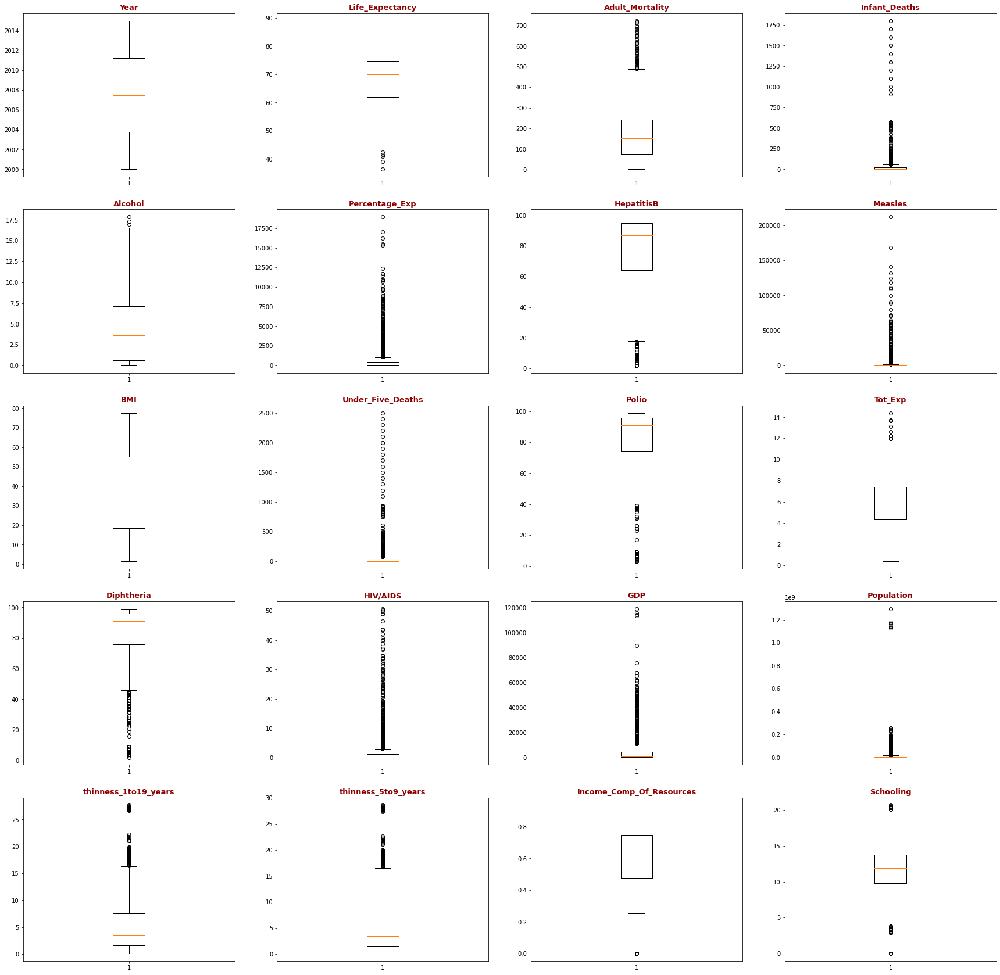

In [18]:
plt.figure(figsize=(30,30))

for i in range(4):
    plt.subplot(5, 4, i+1)
    plt.boxplot(df4[column_list[i+1]])
    plt.title(column_list[i+1], fontdict=title_font)
for i in range(4):
    plt.subplot(5, 4, i+5)
    plt.boxplot(df4[column_list[i+5]])
    plt.title(column_list[i+5], fontdict=title_font)
for i in range(4):
    plt.subplot(5, 4, i+9)
    plt.boxplot(df4[column_list[i+9]])
    plt.title(column_list[i+9], fontdict=title_font)
for i in range(4):
    plt.subplot(5, 4, i+13)
    plt.boxplot(df4[column_list[i+13]])
    plt.title(column_list[i+13], fontdict=title_font)
for i in range(4):
    plt.subplot(5, 4, i+17)
    plt.boxplot(df4[column_list[i+17]])
    plt.title(column_list[i+17], fontdict=title_font)
plt.show()

In [19]:
col_list_int=column_list.copy()
col_list_int.remove("Country")
col_list_int.remove("Developing")
col_list_int

['Year',
 'Life_Expectancy',
 'Adult_Mortality',
 'Infant_Deaths',
 'Alcohol',
 'Percentage_Exp',
 'HepatitisB',
 'Measles',
 'BMI',
 'Under_Five_Deaths',
 'Polio',
 'Tot_Exp',
 'Diphtheria',
 'HIV/AIDS',
 'GDP',
 'Population',
 'thinness_1to19_years',
 'thinness_5to9_years',
 'Income_Comp_Of_Resources',
 'Schooling']

In [20]:
outliers=[]
for x in col_list_int:
    q75, q25 = np.percentile(df4[x], [75 ,25])
    iqr = q75 - q25

    min_val = q25 - (iqr*1.5)
    max_val = q75 + (iqr*1.5)
    outlier_number = len((np.where((df4[x] > max_val)|(df4[x]< min_val))[0]))
    outlier_percentage= len((np.where((df4[x] > max_val) | (df4[x] < min_val))[0]))*100/df4.shape[0]
    outliers.append({"Column":x,"Number_of_outliers":outlier_number,"Percentage":outlier_percentage})

pd.DataFrame(outliers)

,Column,Number_of_outliers,Percentage
0,Year,0,0.000000
1,Life_Expectancy,5,0.234962
2,Adult_Mortality,61,2.866541
3,Infant_Deaths,225,10.573308
4,Alcohol,3,0.140977
5,Percentage_Exp,251,11.795113
6,HepatitisB,226,10.620301
7,Measles,393,18.468045
8,BMI,0,0.000000
9,Under_Five_Deaths,251,11.795113


In [21]:
winsorized_column_list=[]
winsorized_Life_Expectancy=winsorize(df4["Life_Expectancy"],(0.003,0))
winsorized_column_list.append(winsorized_Life_Expectancy)
winsorized_Adult_Mortality=winsorize(df4["Adult_Mortality"],(0,0.03))
winsorized_column_list.append(winsorized_Adult_Mortality)
winsorized_Infant_Deaths=winsorize(df4["Infant_Deaths"],(0,0.106))
winsorized_column_list.append(winsorized_Infant_Deaths)
winsorized_Alcohol=winsorize(df4["Alcohol"],(0,0.002))
winsorized_column_list.append(winsorized_Alcohol)
winsorized_Percentage_Exp=winsorize(df4["Percentage_Exp"],(0,0.118))
winsorized_column_list.append(winsorized_Percentage_Exp)
winsorized_HepatitisB=winsorize(df4["HepatitisB"],(0.107,0))
winsorized_column_list.append(winsorized_HepatitisB)
winsorized_Measles=winsorize(df4["Measles"],(0,0.185))
winsorized_column_list.append(winsorized_Measles)
winsorized_Under_Five_Deaths=winsorize(df4["Under_Five_Deaths"],(0,0.118))
winsorized_column_list.append(winsorized_Under_Five_Deaths)
winsorized_Polio=winsorize(df4["Polio"],(0.081,0))
winsorized_column_list.append(winsorized_Polio)
winsorized_Tot_Exp=winsorize(df4["Tot_Exp"],(0,0.007))
winsorized_column_list.append(winsorized_Tot_Exp)
winsorized_Diphtheria=winsorize(df4["Diphtheria"],(0.105,0))
winsorized_column_list.append(winsorized_Diphtheria)
winsorized_HIV_AIDS=winsorize(df4["HIV/AIDS"],(0,0.16))
winsorized_column_list.append(winsorized_HIV_AIDS)
winsorized_GDP=winsorize(df4["GDP"],(0,0.124))
winsorized_column_list.append(winsorized_GDP)
winsorized_Population=winsorize(df4["Population"],(0,0.127))
winsorized_column_list.append(winsorized_Population)
winsorized_thinness_1to19_years=winsorize(df4["thinness_1to19_years"],(0,0.036))
winsorized_column_list.append(winsorized_thinness_1to19_years)
winsorized_thinness_5to9_years=winsorize(df4["thinness_5to9_years"],(0,0.038))
winsorized_column_list.append(winsorized_thinness_5to9_years)
winsorized_Income_Comp_Of_Resources=winsorize(df4["Income_Comp_Of_Resources"],(0.043,0))
winsorized_column_list.append(winsorized_Income_Comp_Of_Resources)
winsorized_Schooling=winsorize(df4["Schooling"],(0.012,0.006))
winsorized_column_list.append(winsorized_Schooling)

In [22]:
winsorized_column_names=["winsorized_Life_Expectancy","winsorized_Adult_Mortality", "winsorized_Infant_Deaths",
                        "winsorized_Alcohol","winsorized_Percentage_Exp","winsorized_HepatitisB","winsorized_Measles",
                        "winsorized_Under_Five_Deaths","winsorized_Polio","winsorized_Tot_Exp","winsorized_Diphtheria",
                        "winsorized_HIV_AIDS","winsorized_GDP","winsorized_Population","winsorized_thinness_1to19_years",
                        "winsorized_thinness_5to9_years","winsorized_Income_Comp_Of_Resources","winsorized_Schooling"]

In [23]:
q75, q25 = np.percentile(winsorized_Schooling, [75 ,25])
iqr = q75 - q25

min_val = q25 - (iqr*1.5)
max_val = q75 + (iqr*1.5)
outlier_number = len((np.where((winsorized_Schooling > max_val)|(winsorized_Schooling< min_val))[0]))
outlier_percentage= len((np.where((winsorized_Schooling > max_val) | (winsorized_Schooling < min_val))[0]))*100/df4.shape[0]
print(outlier_number)
print(outlier_percentage)

0
0.0


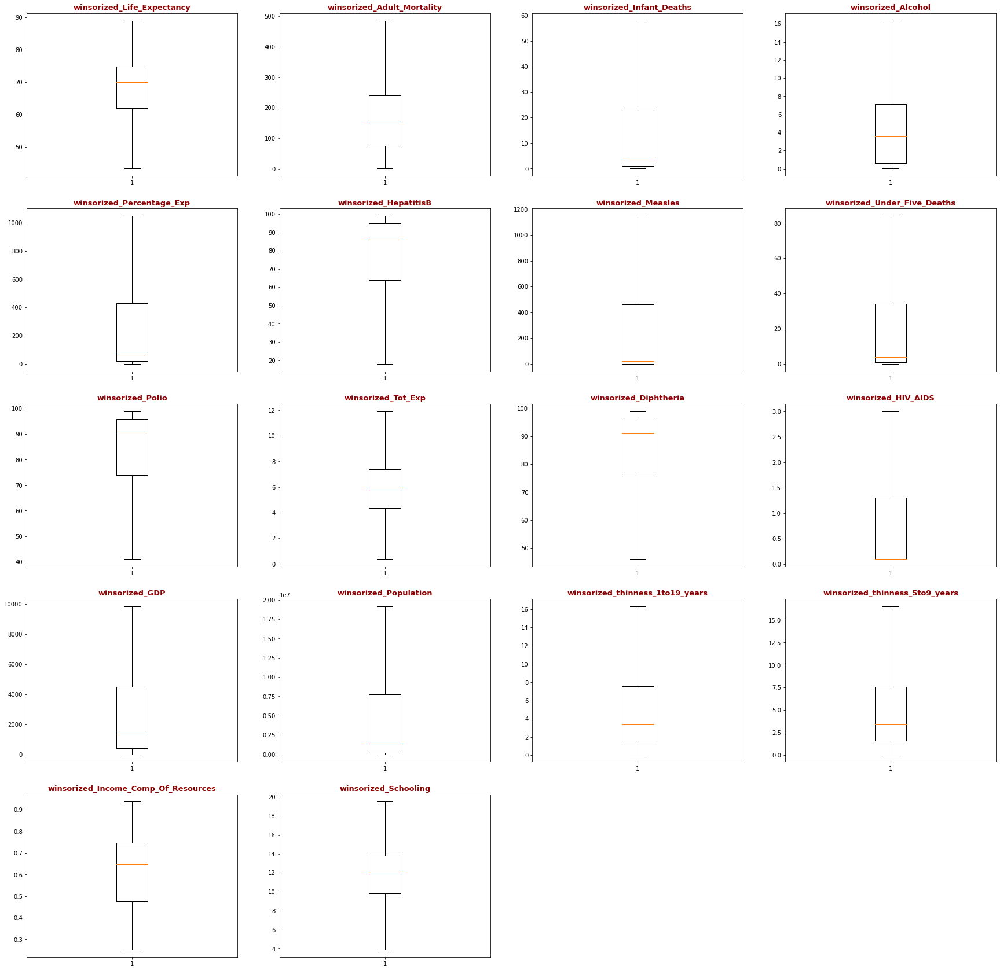

In [24]:
plt.figure(figsize=(30,30))

for i in range(len(winsorized_column_names)):
    plt.subplot(5, 4, i+1)
    plt.boxplot(winsorized_column_list[i])
    plt.title(winsorized_column_names[i], fontdict=title_font)
plt.show()

In [25]:
df4.head()

,Country,Year,Life_Expectancy,Adult_Mortality,Infant_Deaths,Alcohol,Percentage_Exp,HepatitisB,Measles,BMI,...,Tot_Exp,Diphtheria,HIV/AIDS,GDP,Population,thinness_1to19_years,thinness_5to9_years,Income_Comp_Of_Resources,Schooling,Developing
0,Afghanistan,2015,65.0,263.0,62,0.01,71.279624,65.0,1154,19.1,...,8.16,65.0,0.1,584.259210,33736494.0,17.2,17.3,0.479,10.1,1
1,Afghanistan,2014,59.9,271.0,64,0.01,73.523582,62.0,492,18.6,...,8.18,62.0,0.1,612.696514,327582.0,17.5,17.5,0.476,10.0,1
2,Afghanistan,2013,59.9,268.0,66,0.01,73.219243,64.0,430,18.1,...,8.13,64.0,0.1,631.744976,31731688.0,17.7,17.7,0.470,9.9,1
3,Afghanistan,2012,59.5,272.0,69,0.01,78.184215,67.0,2787,17.6,...,8.52,67.0,0.1,669.959000,3696958.0,17.9,18.0,0.463,9.8,1
4,Afghanistan,2011,59.2,275.0,71,0.01,7.097109,68.0,3013,17.2,...,7.87,68.0,0.1,63.537231,2978599.0,18.2,18.2,0.454,9.5,1


In [26]:
df5=pd.DataFrame()
df5["Country"] = df4.Country
df5["Year"] = df4.Year
df5['winsorized_Life_Expectancy'] = winsorized_Life_Expectancy
df5['winsorized_Adult_Mortality'] = winsorized_Adult_Mortality
df5['winsorized_Infant_Deaths'] = winsorized_Infant_Deaths
df5['winsorized_Alcohol'] = winsorized_Alcohol
df5['winsorized_Percentage_Exp'] = winsorized_Percentage_Exp
df5['winsorized_HepatitisB'] = winsorized_HepatitisB
df5["winsorized_Measles"] = winsorized_Measles
df5["BMI"] = df4.BMI
df5['winsorized_Under_Five_Deaths'] = winsorized_Under_Five_Deaths
df5['winsorized_Polio'] = winsorized_Polio
df5['winsorized_Tot_Exp'] = winsorized_Tot_Exp
df5['winsorized_Diphtheria'] = winsorized_Diphtheria
df5['winsorized_HIV/AIDS'] = winsorized_HIV_AIDS
df5['winsorized_GDP'] = winsorized_GDP
df5['winsorized_Population'] = winsorized_Population
df5['winsorized_thinness_1to19_years'] = winsorized_thinness_1to19_years
df5['winsorized_thinness_5to9_years'] = winsorized_thinness_5to9_years
df5['winsorized_Income_Comp_Of_Resources'] = winsorized_Income_Comp_Of_Resources
df5['winsorized_Schooling'] = winsorized_Schooling
df5["Developing"] = df4.Developing
df5.head()

,Country,Year,winsorized_Life_Expectancy,winsorized_Adult_Mortality,winsorized_Infant_Deaths,winsorized_Alcohol,winsorized_Percentage_Exp,winsorized_HepatitisB,winsorized_Measles,BMI,...,winsorized_Tot_Exp,winsorized_Diphtheria,winsorized_HIV/AIDS,winsorized_GDP,winsorized_Population,winsorized_thinness_1to19_years,winsorized_thinness_5to9_years,winsorized_Income_Comp_Of_Resources,winsorized_Schooling,Developing
0,Afghanistan,2015,65.0,263.0,58,0.01,71.279624,65.0,1147,19.1,...,8.16,65.0,0.1,584.259210,19148219.0,16.3,16.5,0.479,10.1,1
1,Afghanistan,2014,59.9,271.0,58,0.01,73.523582,62.0,492,18.6,...,8.18,62.0,0.1,612.696514,327582.0,16.3,16.5,0.476,10.0,1
2,Afghanistan,2013,59.9,268.0,58,0.01,73.219243,64.0,430,18.1,...,8.13,64.0,0.1,631.744976,19148219.0,16.3,16.5,0.470,9.9,1
3,Afghanistan,2012,59.5,272.0,58,0.01,78.184215,67.0,1147,17.6,...,8.52,67.0,0.1,669.959000,3696958.0,16.3,16.5,0.463,9.8,1
4,Afghanistan,2011,59.2,275.0,58,0.01,7.097109,68.0,1147,17.2,...,7.87,68.0,0.1,63.537231,2978599.0,16.3,16.5,0.454,9.5,1


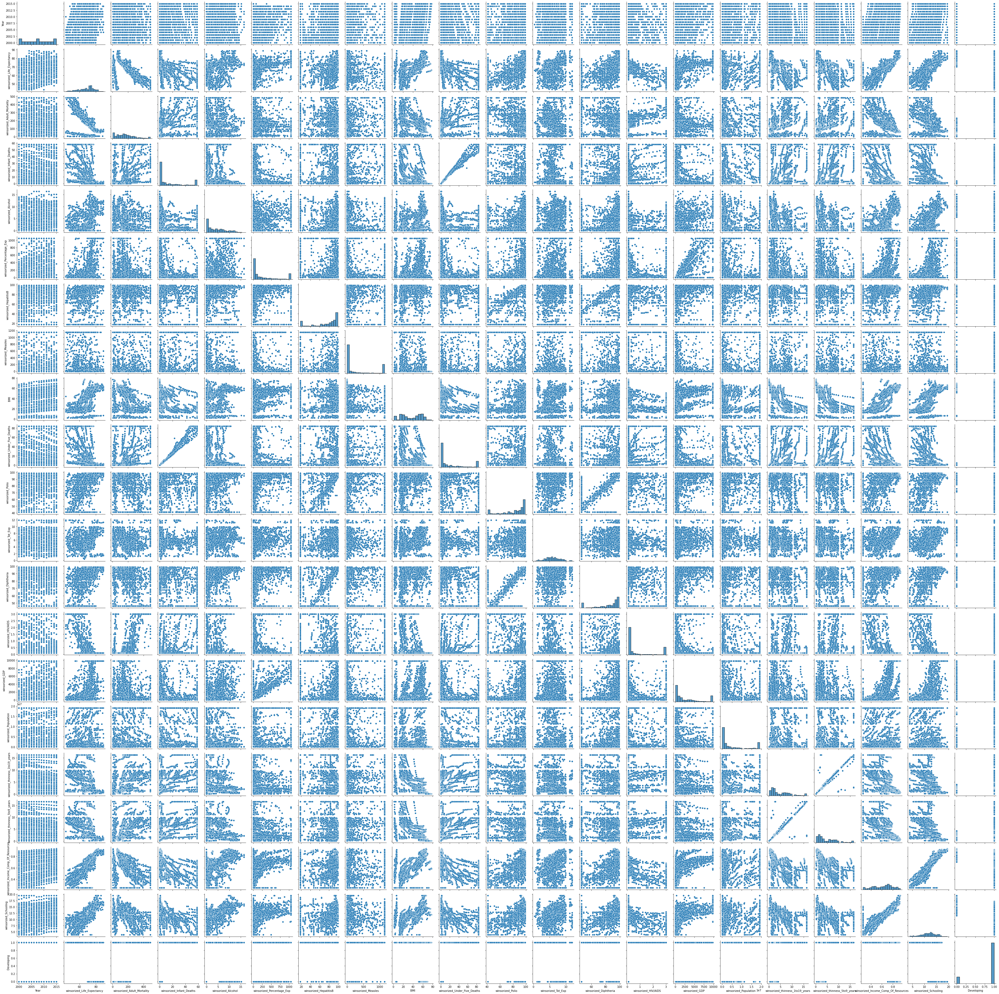

In [27]:
g = sns.PairGrid(df5)
g.map_diag(sns.histplot)
g.map_offdiag(sns.scatterplot)

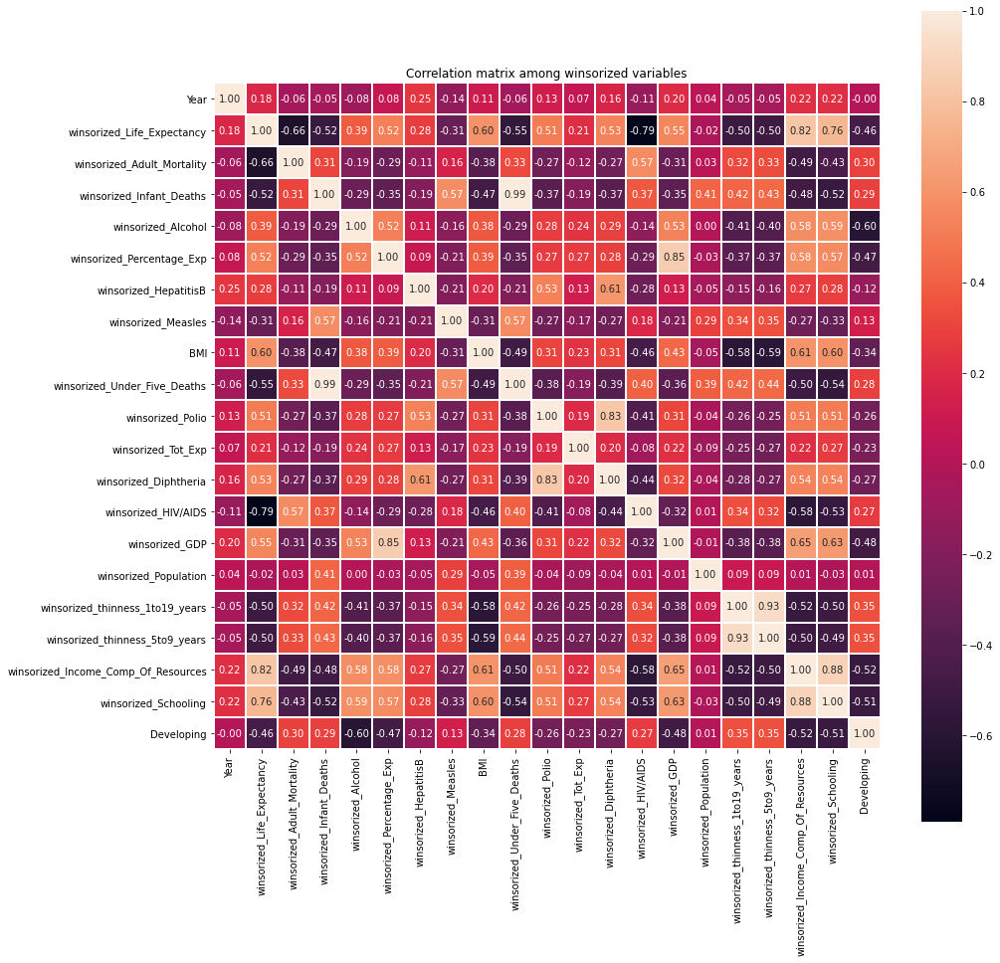

In [28]:
plt.figure(figsize=(15,15))
sns.heatmap(df5.corr(), square=True, annot=True, linewidths=1, fmt=".2f")
plt.title("Correlation matrix among winsorized variables")
plt.show()

***
### We are checking the correlation of columns with the winsorized_Life_Expectancy from the tables above:

1. **It has a positive correlation with winsorized_Income_Comp_Of_Resources**
2. **It has a positive correlation with winsorized_Schooling**
3. **It has a negative correlation with winsorized_HIV/AIDS**
4. **It has a negative correlation with winsorized_Adult_Mortality**

***

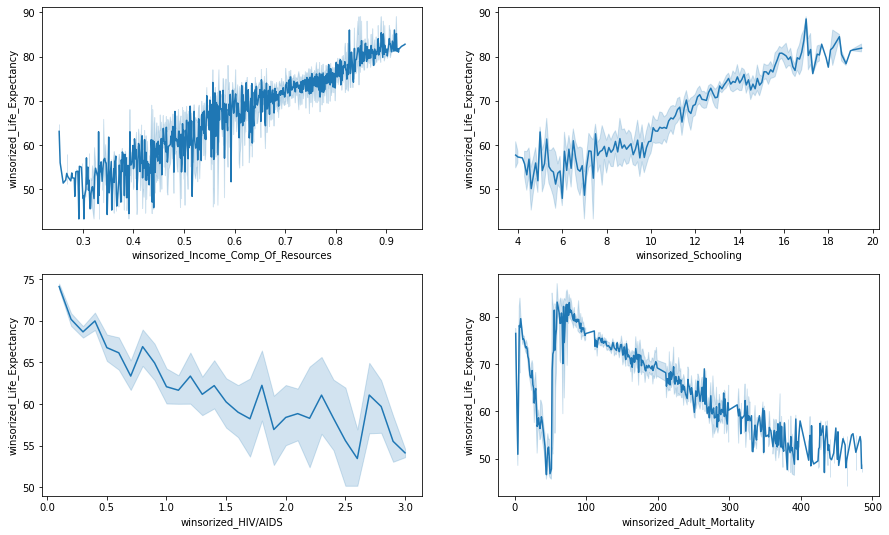

In [29]:
plt.figure(figsize=(15,9))
plt.subplot(221)
sns.lineplot(x="winsorized_Income_Comp_Of_Resources", y="winsorized_Life_Expectancy", data=df5)
plt.subplot(222)
sns.lineplot(x="winsorized_Schooling", y="winsorized_Life_Expectancy", data=df5)
plt.subplot(223)
sns.lineplot(x="winsorized_HIV/AIDS", y="winsorized_Life_Expectancy", data=df5)
plt.subplot(224)
sns.lineplot(x="winsorized_Adult_Mortality", y="winsorized_Life_Expectancy", data=df5)
plt.show()

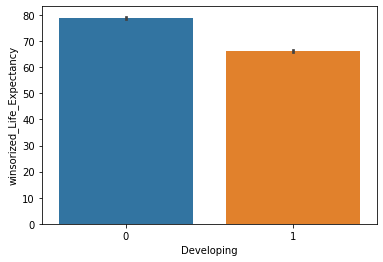

In [30]:
sns.barplot(x="Developing", y="winsorized_Life_Expectancy", data=df5)
plt.show()

In [31]:
df5.groupby("Country").mean().sort_values(by="winsorized_Life_Expectancy", ascending=False)

,Year,winsorized_Life_Expectancy,winsorized_Adult_Mortality,winsorized_Infant_Deaths,winsorized_Alcohol,winsorized_Percentage_Exp,winsorized_HepatitisB,winsorized_Measles,BMI,winsorized_Under_Five_Deaths,...,winsorized_Tot_Exp,winsorized_Diphtheria,winsorized_HIV/AIDS,winsorized_GDP,winsorized_Population,winsorized_thinness_1to19_years,winsorized_thinness_5to9_years,winsorized_Income_Comp_Of_Resources,winsorized_Schooling,Developing
Country,,,,,,,,,,,,,,,,,,,,,
Sweden,2007.5,82.51875,59.1875,0.0000,6.950000,914.239811,47.3750,18.9375,56.25000,0.0000,...,10.055000,98.3125,0.10000,8151.289414,5.514868e+06,1.35000,1.30625,0.893125,15.86875,0
France,2007.5,82.21875,73.1250,2.9375,12.348125,818.369273,51.2500,518.5625,51.98125,3.4375,...,6.867500,98.0625,0.10000,8007.695714,1.088245e+07,0.62500,0.60000,0.870562,15.90000,1
Italy,2007.5,82.18750,54.1875,2.0000,8.222500,720.693258,95.5000,530.4375,56.15000,2.3125,...,8.806875,94.7500,0.10000,6644.571456,1.034475e+07,0.51250,0.52500,0.858062,15.93125,0
Spain,2007.5,82.06875,63.6250,1.6250,9.398125,726.029841,92.5000,280.3750,58.66875,1.8750,...,8.584375,96.7500,0.10000,7059.376763,1.226861e+07,0.60000,0.50000,0.850562,16.35625,0
Australia,2007.5,81.81250,63.1875,1.0000,10.127500,806.723570,93.4375,103.9375,55.86250,1.3750,...,8.873125,89.1875,0.10000,7657.000981,3.825117e+06,0.66875,0.62500,0.918125,19.41875,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
Malawi,2007.5,49.90625,380.8750,37.1250,0.862500,25.849706,86.3750,211.6250,16.78125,58.7500,...,6.911875,85.9375,3.00000,237.504042,6.700263e+06,7.11875,6.98750,0.410625,10.23125,1
Angola,2007.5,49.01875,328.5625,58.0000,5.902500,102.100268,71.4375,869.9375,18.01875,84.0000,...,3.881250,58.6250,2.36875,1975.143045,9.328542e+06,6.19375,6.66875,0.458375,8.04375,1
Lesotho,2007.5,48.78125,457.8750,4.5000,1.956875,82.118913,64.2500,182.8750,25.23750,6.3125,...,7.233125,84.0625,3.00000,794.523010,1.200528e+06,7.18750,7.06875,0.456813,10.65625,1


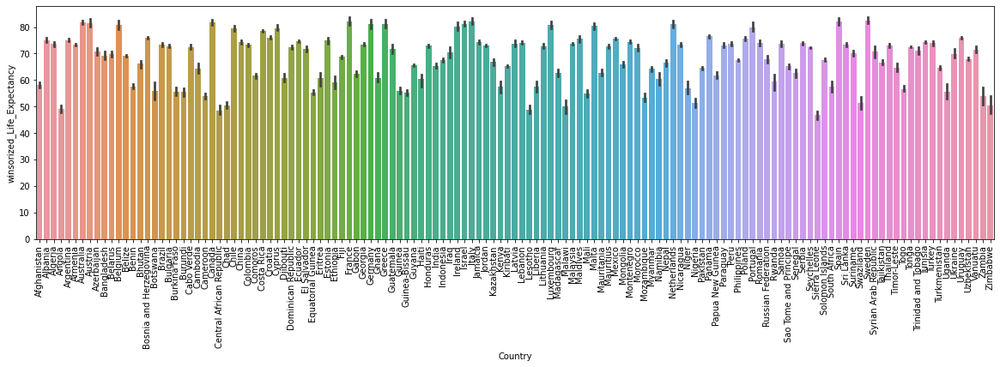

In [32]:
plt.figure(figsize=(20,5))
sns.barplot(df5.Country, df5.winsorized_Life_Expectancy)
plt.xticks(rotation=90, fontsize=10)
plt.show()

In [33]:
t1=stats.ttest_ind(df5.winsorized_Life_Expectancy, df5.winsorized_Income_Comp_Of_Resources)
t2=stats.ttest_ind(df5.winsorized_Life_Expectancy, df5.winsorized_Schooling)
t3=stats.ttest_ind(df5.winsorized_Life_Expectancy, df5["winsorized_HIV/AIDS"])
t4=stats.ttest_ind(df5.winsorized_Life_Expectancy, df5.winsorized_Adult_Mortality)
ttests=[[t1, t2, t3, t4]]
ttests

[[Ttest_indResult(statistic=324.82449141689426, pvalue=0.0),
  Ttest_indResult(statistic=258.09896623883014, pvalue=0.0),
  Ttest_indResult(statistic=321.73548248162547, pvalue=0.0),
  Ttest_indResult(statistic=-39.24620447570742, pvalue=8.506650200601604e-288)]]

In [ ]:
#ttest normalize ettikten sonra tekrar denenebilir.

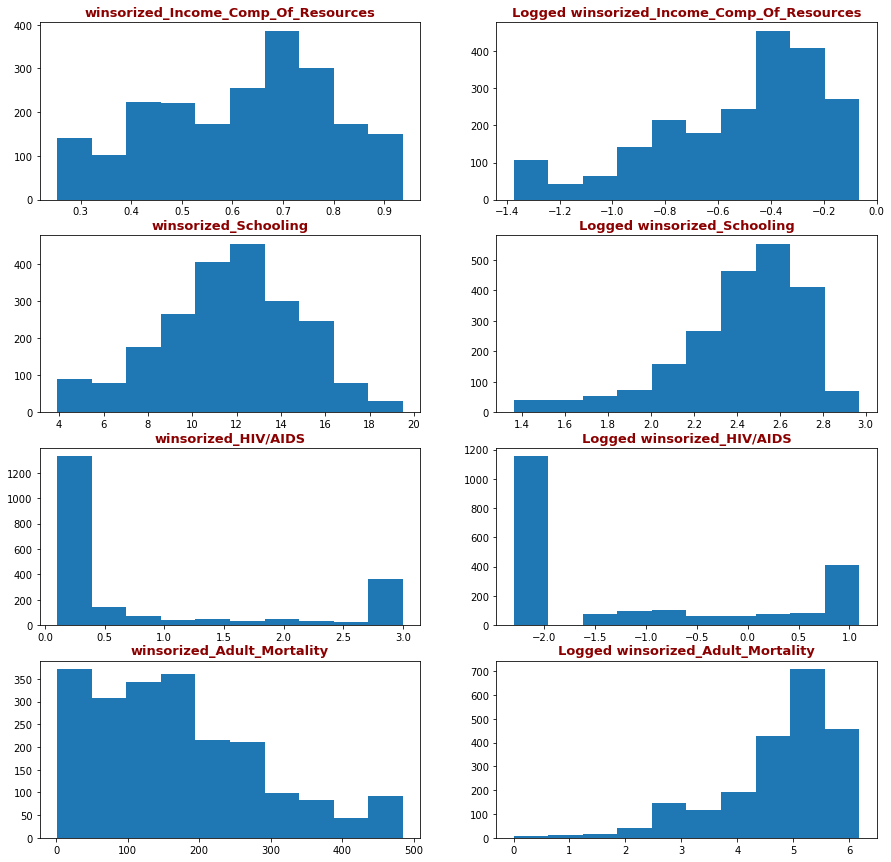

In [34]:
plt.figure(figsize=(15,15))
plt.subplot(421)
plt.title("winsorized_Income_Comp_Of_Resources", fontdict=title_font)
plt.hist(df5.winsorized_Income_Comp_Of_Resources)
plt.subplot(422)
plt.title("Logged winsorized_Income_Comp_Of_Resources", fontdict=title_font)
plt.hist(np.log(df5.winsorized_Income_Comp_Of_Resources))
plt.subplot(423)
plt.title("winsorized_Schooling", fontdict=title_font)
plt.hist(df5.winsorized_Schooling)
plt.subplot(424)
plt.title("Logged winsorized_Schooling", fontdict=title_font)
plt.hist(np.log(df5.winsorized_Schooling))
plt.subplot(425)
plt.title("winsorized_HIV/AIDS", fontdict=title_font)
plt.hist(df5["winsorized_HIV/AIDS"])
plt.subplot(426)
plt.title("Logged winsorized_HIV/AIDS", fontdict=title_font)
plt.hist(np.log(df5["winsorized_HIV/AIDS"]))
plt.subplot(427)
plt.title("winsorized_Adult_Mortality", fontdict=title_font)
plt.hist(df5.winsorized_Adult_Mortality)
plt.subplot(428)
plt.title("Logged winsorized_Adult_Mortality", fontdict=title_font)
plt.hist(np.log(df5.winsorized_Adult_Mortality))
plt.show()

In [35]:
pd.options.display.float_format = '{:.5f}'.format

variables = ["winsorized_Life_Expectancy","winsorized_Income_Comp_Of_Resources","winsorized_Schooling","winsorized_HIV/AIDS","winsorized_Adult_Mortality"]
distribution_tests = pd.DataFrame(columns=['variable', 'jarque_bera_stats', 'jarque_bera_p_value', 
                                         'normal_stats', 'normal_p_value'])

for var in variables:
    jb_stats = jarque_bera(np.log(df5[var]))
    norm_stats = normaltest(np.log(df5[var]))
    distribution_tests = distribution_tests.append({"variable": var,
                                                "jarque_bera_stats" : jb_stats[0] ,
                                                "jarque_bera_p_value" : jb_stats[1] ,
                                                "normal_stats": norm_stats[0] , 
                                                "normal_p_value" : norm_stats[1]
                                               }, ignore_index=True)
distribution_tests

,variable,jarque_bera_stats,jarque_bera_p_value,normal_stats,normal_p_value
0,winsorized_Life_Expectancy,244.85245,0.00000,190.93758,0.00000
1,winsorized_Income_Comp_Of_Resources,307.60758,0.00000,229.11863,0.00000
2,winsorized_Schooling,676.34684,0.00000,388.17137,0.00000
3,winsorized_HIV/AIDS,306.17031,0.00000,3015.77817,0.00000
4,winsorized_Adult_Mortality,1012.90965,0.00000,494.57840,0.00000


In [36]:
stats.ttest_ind(df5.winsorized_Income_Comp_Of_Resources, df5.winsorized_Schooling)

Ttest_indResult(statistic=-162.96269788127412, pvalue=0.0)

In [37]:
correlation = df5.corr().abs().unstack().drop_duplicates().sort_values(kind="quicksort", ascending = False)
correlation[range(10)]

Year                                 Year                                  1.00000
winsorized_Infant_Deaths             winsorized_Under_Five_Deaths          0.99416
winsorized_thinness_1to19_years      winsorized_thinness_5to9_years        0.92913
winsorized_Income_Comp_Of_Resources  winsorized_Schooling                  0.88212
winsorized_Percentage_Exp            winsorized_GDP                        0.85424
winsorized_Polio                     winsorized_Diphtheria                 0.82521
winsorized_Life_Expectancy           winsorized_Income_Comp_Of_Resources   0.81969
                                     winsorized_HIV/AIDS                   0.79045
                                     winsorized_Schooling                  0.75942
                                     winsorized_Adult_Mortality            0.65621
dtype: float64

In [38]:
df5.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2128 entries, 0 to 2937
Data columns (total 22 columns):
 #   Column                               Non-Null Count  Dtype  
---  ------                               --------------  -----  
 0   Country                              2128 non-null   object 
 1   Year                                 2128 non-null   int64  
 2   winsorized_Life_Expectancy           2128 non-null   float64
 3   winsorized_Adult_Mortality           2128 non-null   float64
 4   winsorized_Infant_Deaths             2128 non-null   int64  
 5   winsorized_Alcohol                   2128 non-null   float64
 6   winsorized_Percentage_Exp            2128 non-null   float64
 7   winsorized_HepatitisB                2128 non-null   float64
 8   winsorized_Measles                   2128 non-null   int64  
 9   BMI                                  2128 non-null   float64
 10  winsorized_Under_Five_Deaths         2128 non-null   int64  
 11  winsorized_Polio              

In [39]:
df6=df5.select_dtypes(exclude='object')

In [40]:
X=df6.values

In [41]:
len(df6.columns)

21

In [42]:
X = StandardScaler().fit_transform(df6)
pca = PCA(n_components=21)
principalComponents=pca.fit_transform(X)

In [43]:
exp_var= pca.explained_variance_ratio_
cumsum_var=np.cumsum(np.round(pca.explained_variance_ratio_, decimals=4)*100)
print(exp_var)
print(cumsum_var)

[3.97152097e-01 9.36054741e-02 8.89849388e-02 6.41958180e-02
 5.65178679e-02 5.07423389e-02 4.03064567e-02 3.15458922e-02
 3.07030890e-02 2.64340164e-02 2.27825794e-02 2.09071484e-02
 1.89140627e-02 1.73789371e-02 1.18421506e-02 7.85999780e-03
 6.43373634e-03 5.96224569e-03 4.27767203e-03 3.23619999e-03
 2.17280564e-04]
[39.72 49.08 57.98 64.4  70.05 75.12 79.15 82.3  85.37 88.01 90.29 92.38
 94.27 96.01 97.19 97.98 98.62 99.22 99.65 99.97 99.99]


In [54]:
principalComponents
a=pd.DataFrame(principalComponents)
a

,0,1,2,3,4,5,6,7
0,4.58521,2.33327,2.41043,-0.57782,1.02458,1.95343,1.85301,0.84351
1,4.27482,0.62595,1.45335,0.29428,1.47582,1.76980,2.17565,-0.50530
2,4.34346,1.59634,2.33435,-0.04001,0.88971,1.61521,1.58338,1.51632
3,4.41611,1.17967,2.11916,0.30844,1.33038,0.99478,2.33519,-0.53905
4,4.58138,0.98552,2.13168,0.20776,1.32729,0.69152,2.11759,-0.64860
...,...,...,...,...,...,...,...,...
2123,4.05361,0.15076,-0.95533,2.27364,-0.81210,-0.04143,-0.48087,1.73598
2124,4.96284,1.52923,-1.76824,1.28730,0.00818,-0.20895,-0.29505,1.42884
2125,2.25256,-0.28681,-1.82268,0.45742,-1.71531,-1.03347,0.30383,-0.86225
2126,3.16552,0.19234,-1.16845,1.56088,-2.48845,-0.91049,-1.09191,0.84943


Text(0, 0.5, '% of Variance Explained')

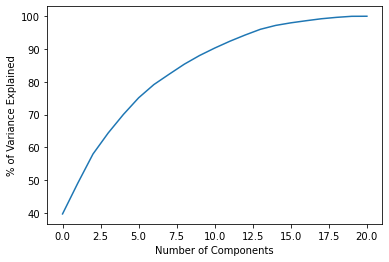

In [44]:
plt.plot(cumsum_var)
plt.xlabel('Number of Components')
plt.ylabel('% of Variance Explained')

In [45]:
X = StandardScaler().fit_transform(df6)
pca = PCA(n_components=8)
principalComponents=pca.fit_transform(X)

In [46]:
exp_var= pca.explained_variance_ratio_
cumsum_var=np.cumsum(np.round(pca.explained_variance_ratio_, decimals=4)*100)
print(exp_var)
print(cumsum_var)

[0.3971521  0.09360547 0.08898494 0.06419582 0.05651787 0.05074234
 0.04030646 0.03154589]
[39.72 49.08 57.98 64.4  70.05 75.12 79.15 82.3 ]


Text(0, 0.5, '% of Variance Explained')

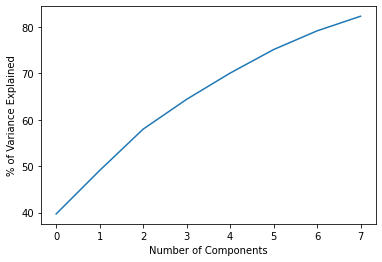

In [47]:
plt.plot(cumsum_var)
plt.xlabel('Number of Components')
plt.ylabel('% of Variance Explained')

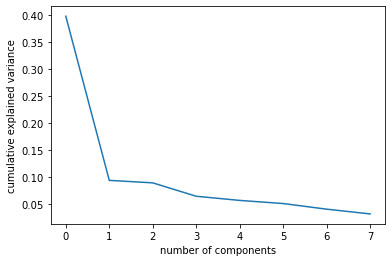

In [48]:
plt.plot(pca.explained_variance_ratio_)
plt.xlabel('number of components')
plt.ylabel('cumulative explained variance')
plt.show()

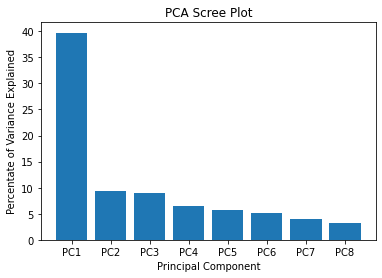

In [49]:
percent_variance = np.round(pca.explained_variance_ratio_* 100, decimals =2)
columns = ['PC1', 'PC2','PC3','PC4','PC5','PC6','PC7','PC8']
plt.bar(x= range(1,9), height=percent_variance, tick_label=columns)
plt.ylabel('Percentate of Variance Explained')
plt.xlabel('Principal Component')
plt.title('PCA Scree Plot')
plt.show()

In [50]:
X = pd.DataFrame(X, columns=df6.columns)

In [51]:
def myplot(score,coeff,labels=None):
    xs = score[:,0]
    ys = score[:,1]
    n = coeff.shape[0]
    scalex = 1.0/(xs.max() - xs.min())
    scaley = 1.0/(ys.max() - ys.min())
    fig = plt.figure(figsize=(12,6), dpi=100)
    plt.scatter(xs * scalex,ys * scaley,s=5)
    for i in range(n):
        plt.arrow(0, 0, coeff[i,0], coeff[i,1],color = 'r',alpha = 0.5)
        if labels is None:
            plt.text(coeff[i,0]* 1.15, coeff[i,1] * 1.15, "Var"+str(i+1), color = 'green', ha = 'center', va = 'center')
        else:
            plt.text(coeff[i,0]* 1.15, coeff[i,1] * 1.15, labels[i], color = 'g', ha = 'center', va = 'center')
 
    plt.xlabel("PC{}".format(1))
    plt.ylabel("PC{}".format(2))
    plt.grid()

In [60]:
len(np.unique(pca.components_[:,0]))

8

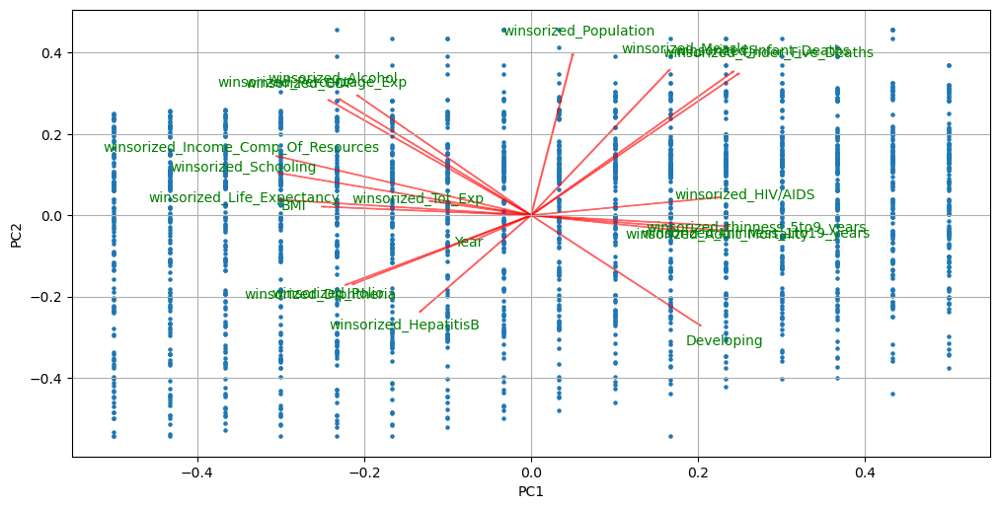

In [52]:
myplot(np.array(X)[:,0:2],np.transpose(pca.components_[0:2, :]),list(X.columns))
plt.show()